In [33]:
import os
import numpy as np
import pandas as pd
import mne
from mne.decoding import SPoC
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs,corrmap)
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from mne.time_frequency import psd_multitaper, tfr_multitaper, tfr_morlet
import warnings
from sklearn.model_selection import ShuffleSplit
from mne.preprocessing import Xdawn
from operator import itemgetter
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import KFold, cross_val_predict
from mne.decoding import CSP, cross_val_multiscore
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from Channel_Selector import order_channels
from Start_And_Finish_Markers import Start_And_Finish_Markers
from pyriemann.estimation import Covariances
from pyriemann.tangentspace import TangentSpace

In [34]:
# Load a sample of the folder 
# (fdt files are detected and read automatically when .set is inferenced)
sample_data_raw_file = '3TM_01-100.set'
raw = mne.io.read_raw_eeglab(sample_data_raw_file)

Reading C:\Users\thoma\Desktop\MSc - Research Project\PRE_ICA_new_analyses\3TM_01-100.fdt


In [35]:
# What can we see from the raw data
print(raw)
print(raw.info)

<RawEEGLAB | 3TM_01-100.fdt, 63 x 1594040 (3188.1 s), ~87 kB, data not loaded>
<Info | 8 non-empty values
 bads: []
 ch_names: FP1, FPZ, FP2, AF7, AF3, AF4, AF8, F7, F5, F3, F1, FZ, F2, F4, ...
 chs: 63 EEG
 custom_ref_applied: False
 dig: 63 items (63 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 63
 projs: []
 sfreq: 500.0 Hz
>


In [36]:
print(len(raw.annotations)) # 101 Events in this EEG file
print(len(set(raw.annotations.description))) # 95 different events happened
print(set(raw.annotations.description))
print(raw.annotations.onset[0]) # The first event occured 15.5 seconds after the recording began

101
95
{'26.0', '47.0', '45.0', '32.0', '1.0', '33.0', '79.0', '52.0', '100.0', '30.0', '83.0', '16.0', '68.0', '17.0', '70.0', '27.0', '72.0', '63.0', '28.0', '19.0', '34.0', '75.0', '48.0', '62.0', '56.0', '53.0', '13.0', '99.0', '93.0', '71.0', '38.0', '88.0', '43.0', '22.0', '73.0', '44.0', '87.0', '42.0', '97.0', '80.0', '46.0', '50.0', '18.0', '66.0', '37.0', '25.0', '58.0', '95.0', '78.0', '24.0', '91.0', '4.0', '86.0', '55.0', '15.0', '94.0', '23.0', '57.0', '7.0', '76.0', '36.0', '59.0', '35.0', '6.0', '21.0', '31.0', '60.0', '84.0', '41.0', '14.0', '12.0', '92.0', '61.0', '64.0', '49.0', '74.0', '81.0', '39.0', '77.0', '69.0', '96.0', '40.0', '82.0', '11.0', '90.0', '98.0', '20.0', '85.0', '29.0', '54.0', '67.0', '5.0', '65.0', '89.0', '51.0'}
15.541


Effective window size : 4.096 (s)


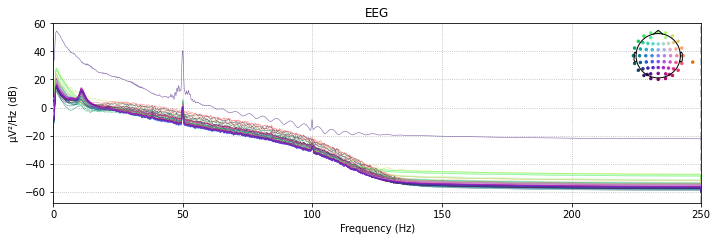

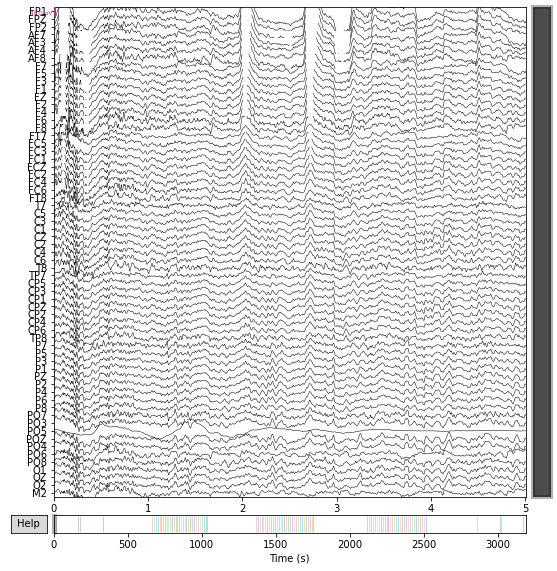

In [37]:
# Power Spectral Density plot (Power per Hz vs Frequency)
raw.plot_psd(fmax=250)
raw.plot(duration=5, n_channels=63)
print("")

In [38]:
# Filter slow drifts. Removing low-frequency drifts that can negatively affect quality of an ICA fit
HP_filtered = raw.load_data().copy().filter(l_freq=1., h_freq=None)

Reading 0 ... 1594039  =      0.000 ...  3188.078 secs...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 sec)



In [39]:
# Fitting and plotting the ICA solution
# The more number of components we have, the more accurate our solution and the better our artifacts isolated, 
# however using more components is computationally expensive. So if you can use fewer, it's better 
warnings.filterwarnings("ignore", category=DeprecationWarning)
ica = ICA(n_components=40, max_iter='auto', random_state=97)
ica.fit(HP_filtered)
ica

Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 40 components
Fitting ICA took 76.6s.


Method,fastica
Fit,52 iterations on raw data (1594040 samples)
ICA components,40
Explained variance,100.0 %
Available PCA components,63
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=40, n_times=1594040
    Range : 0 ... 1594039 =      0.000 ...  3188.078 secs
Ready.


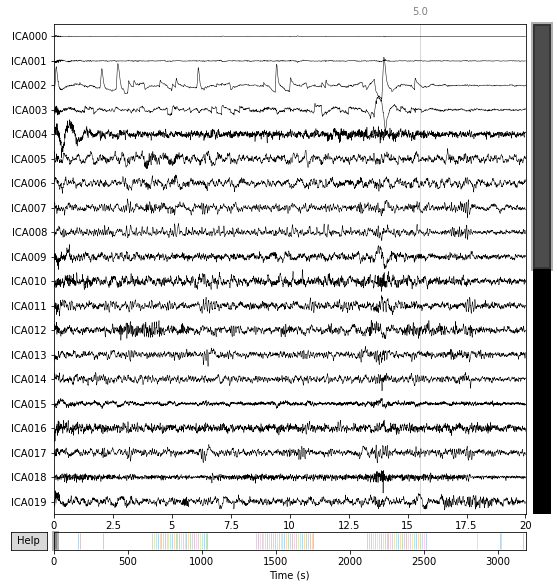

In [40]:
# now we vizualise our independant components and see what they captured
# plot_sources show us the time series of the ICs. 

raw.load_data()
ica.plot_sources(raw, show_scrollbars=True)
print("")

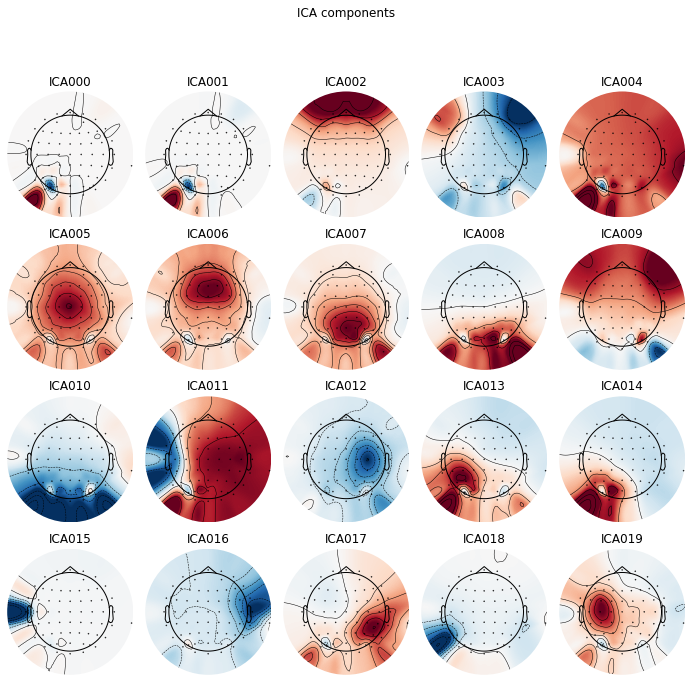

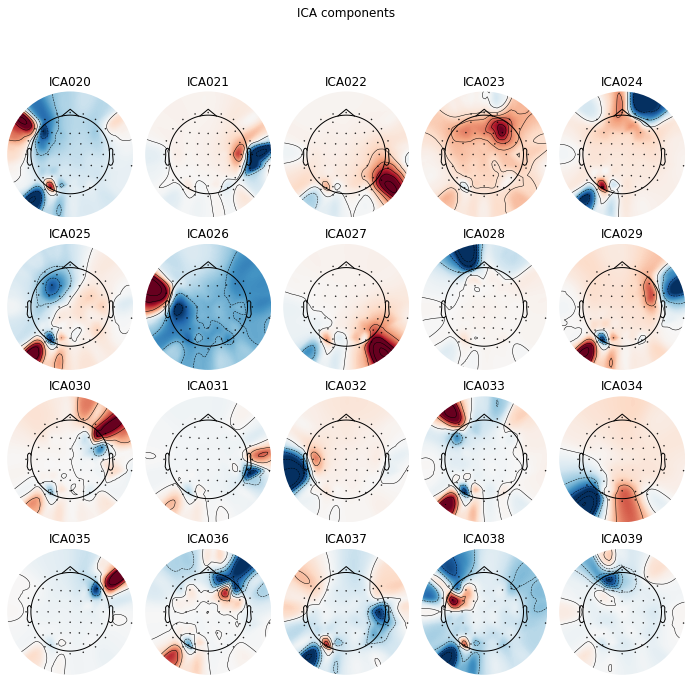

[<MNEFigure size 702x696.24 with 20 Axes>,
 <MNEFigure size 702x696.24 with 20 Axes>]

In [41]:
# Scalp topographies indicating which regions of the scalp are responsible for our noisy artifacts.
# Anterior weight distribution could indicate blinking or eye movement
# Posterior weight distribution could indicate Alpha rhythm noise
warnings.filterwarnings("ignore", category=DeprecationWarning)
ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
1594 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
Not setting metadata
1594 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
Not setting metadata
1594 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
Not setting metadata
1594 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
Not setting metadata
1594 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
Not setting metadata
1594 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
Not setting metada

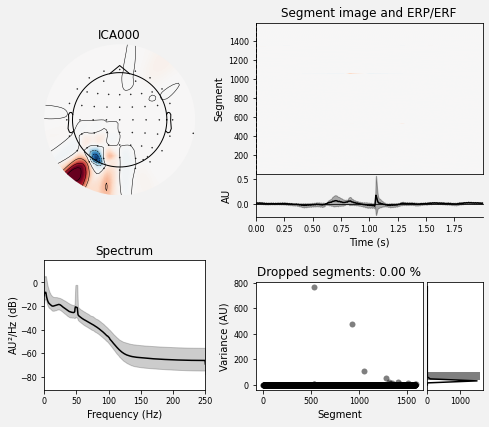

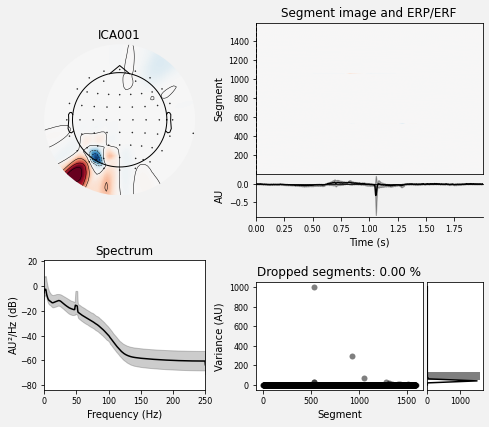

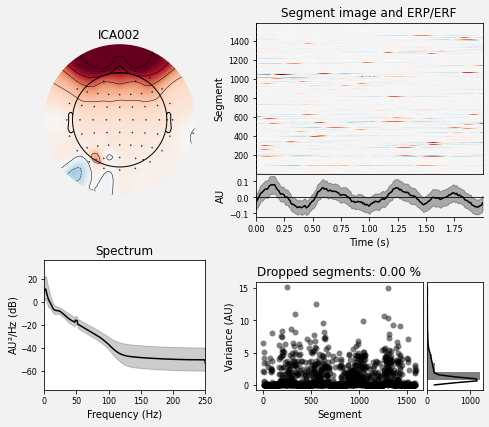

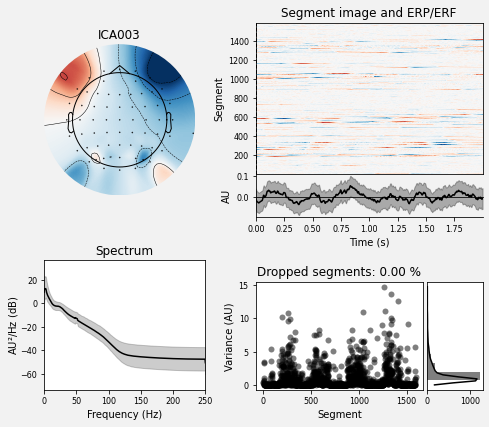

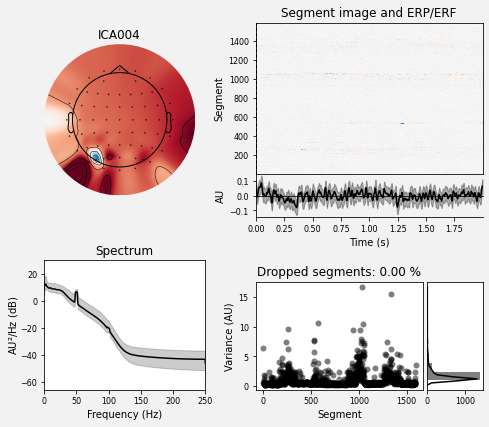

...

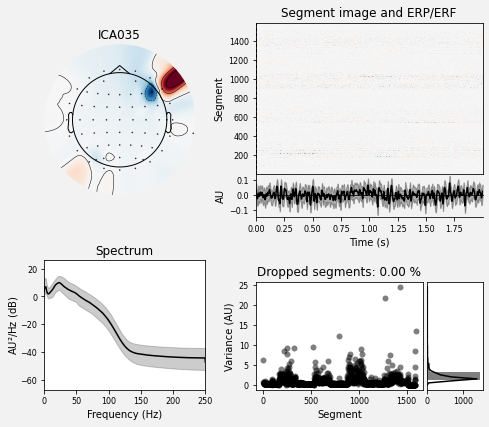

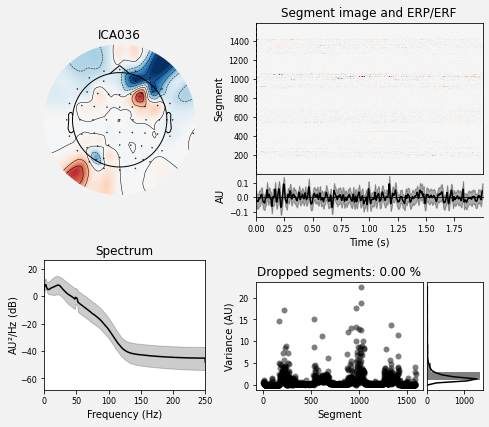

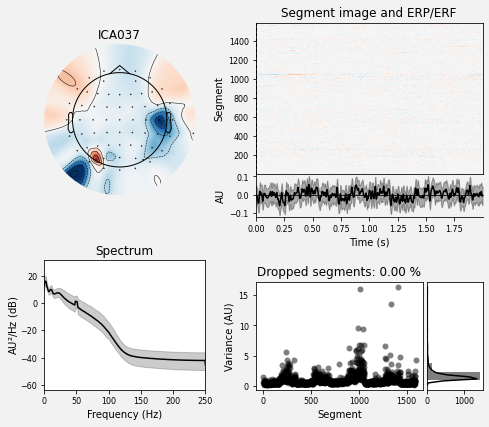

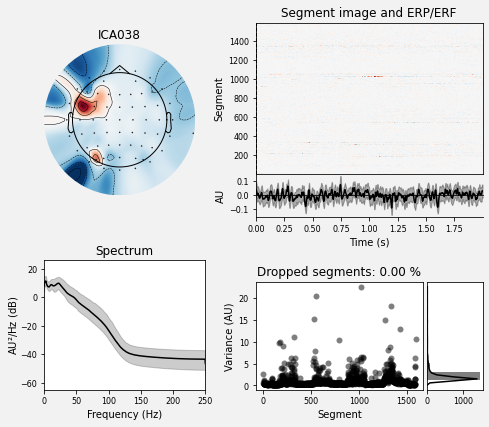

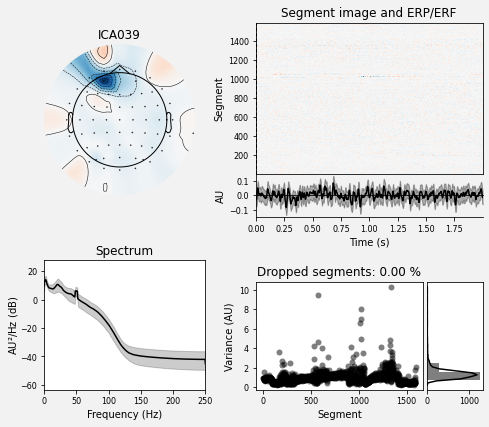

[<Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6

In [42]:
# Plot different charts for each artifact so that we can use different visualizations to find out whether it 
# Needs to be removed or not 
# Watch out for high peaks at the 50Hz range 
# And sudden increases in the power spectrum graph (Muscle movement)
warnings.filterwarnings("ignore", category=DeprecationWarning) 
ica.plot_properties(raw, picks=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39])

In [43]:
# Component 0 and 1 require more investigation. Not much going in ERP chart or time domain chart. Suspiciously uneventful

# Component 2, the weight distribution is majorly anteriorly focused which indicates ocular activity, not to mention the ERP
# graph and time domain chart indicate blink characteristics (randomly distributed blotches on the ERP)

# Component 3, the weight distribution is again, anteriorly focused indicating ocular activity. ERP shares similar 
# characteristics to component 2, but more relates to eye movement as opposed to blinking 

# Component 4, judging by the power spectrum graph peaking at 50hz, indicates some line noise from the national power grid 

# Note the blue blotch of left always visible back left of the skull in every topology. I believe this to be our broken electrode
ica.exclude = [2, 3]

Applying ICA to Raw instance
    Transforming to ICA space (40 components)
    Zeroing out 2 ICA components
    Projecting back using 63 PCA components


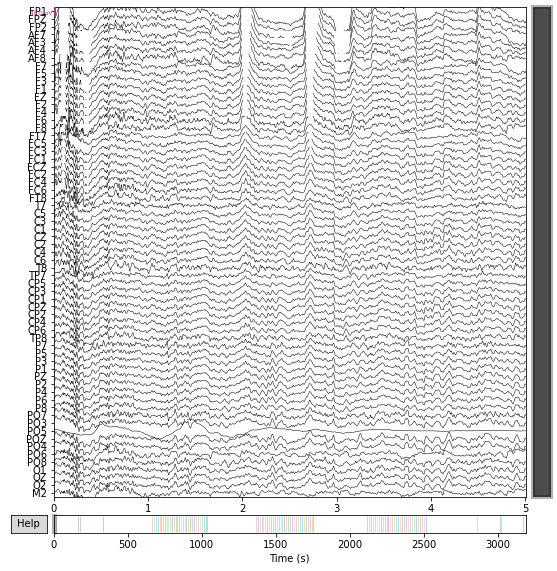

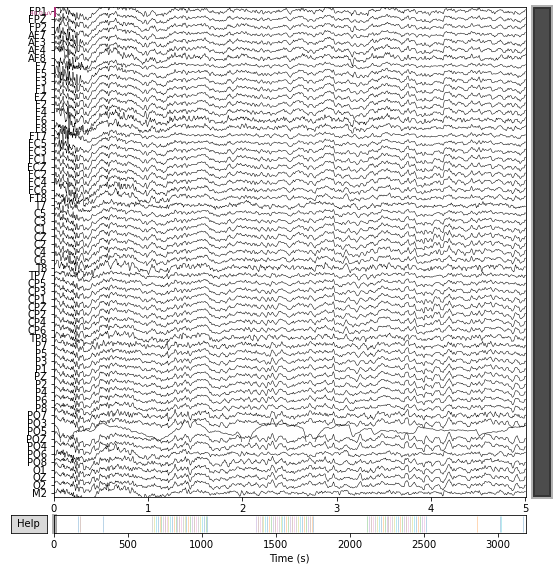

In [44]:
# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = raw.copy()
ica.apply(raw)

reconst_raw.plot(duration=5, n_channels=63)
raw.plot(duration=5, n_channels=63)
del reconst_raw

In [45]:
# Remove these channels because of the issues they cause us later on in the pipeline. There are some obvious issues relating to 
# These electrodes
raw.drop_channels(["PO5", "M2", "PO6"])

<RawEEGLAB | 3TM_01-100.fdt, 60 x 1594040 (3188.1 s), ~729.8 MB, data loaded>

In [46]:
# Convert annotations to events
# Show the annotation descriptions so that we cross reference them with our legend and find out the epoch time intervals
events_from_annot, event_dict = mne.events_from_annotations(raw)

Used Annotations descriptions: ['1.0', '100.0', '11.0', '12.0', '13.0', '14.0', '15.0', '16.0', '17.0', '18.0', '19.0', '20.0', '21.0', '22.0', '23.0', '24.0', '25.0', '26.0', '27.0', '28.0', '29.0', '30.0', '31.0', '32.0', '33.0', '34.0', '35.0', '36.0', '37.0', '38.0', '39.0', '4.0', '40.0', '41.0', '42.0', '43.0', '44.0', '45.0', '46.0', '47.0', '48.0', '49.0', '5.0', '50.0', '51.0', '52.0', '53.0', '54.0', '55.0', '56.0', '57.0', '58.0', '59.0', '6.0', '60.0', '61.0', '62.0', '63.0', '64.0', '65.0', '66.0', '67.0', '68.0', '69.0', '7.0', '70.0', '71.0', '72.0', '73.0', '74.0', '75.0', '76.0', '77.0', '78.0', '79.0', '80.0', '81.0', '82.0', '83.0', '84.0', '85.0', '86.0', '87.0', '88.0', '89.0', '90.0', '91.0', '92.0', '93.0', '94.0', '95.0', '96.0', '97.0', '98.0', '99.0']


In [47]:
# Invoke our function to calculate the start and finish times of each experimental event
WarmWaterStart, WarmWaterEnd, HotWaterStart, HotwaterEnd, SoundStimuliStart, SoundStimuliEnd, EyesOpenStart, EyesOpenStartFin, EyesClosedStart, EyesClosedStartFin, EyesOpenEnd, EyesOpenEndFin, EyesClosedEnd, EyesClosedEndFin = Start_And_Finish_Markers(raw)

Used Annotations descriptions: ['1.0', '100.0', '11.0', '12.0', '13.0', '14.0', '15.0', '16.0', '17.0', '18.0', '19.0', '20.0', '21.0', '22.0', '23.0', '24.0', '25.0', '26.0', '27.0', '28.0', '29.0', '30.0', '31.0', '32.0', '33.0', '34.0', '35.0', '36.0', '37.0', '38.0', '39.0', '4.0', '40.0', '41.0', '42.0', '43.0', '44.0', '45.0', '46.0', '47.0', '48.0', '49.0', '5.0', '50.0', '51.0', '52.0', '53.0', '54.0', '55.0', '56.0', '57.0', '58.0', '59.0', '6.0', '60.0', '61.0', '62.0', '63.0', '64.0', '65.0', '66.0', '67.0', '68.0', '69.0', '7.0', '70.0', '71.0', '72.0', '73.0', '74.0', '75.0', '76.0', '77.0', '78.0', '79.0', '80.0', '81.0', '82.0', '83.0', '84.0', '85.0', '86.0', '87.0', '88.0', '89.0', '90.0', '91.0', '92.0', '93.0', '94.0', '95.0', '96.0', '97.0', '98.0', '99.0']


In [48]:
print(WarmWaterStart, WarmWaterEnd, HotWaterStart, HotwaterEnd, SoundStimuliStart, SoundStimuliEnd, EyesOpenStart, EyesOpenStartFin, EyesClosedStart, EyesClosedStartFin, EyesOpenEnd, EyesOpenEndFin, EyesClosedEnd, EyesClosedEndFin)

665.128 1025.682 2113.952 2501.444 1365.052 1674.58 15.54 165.536 179.204 329.194 2862.554 3012.592 3023.28 3173.308


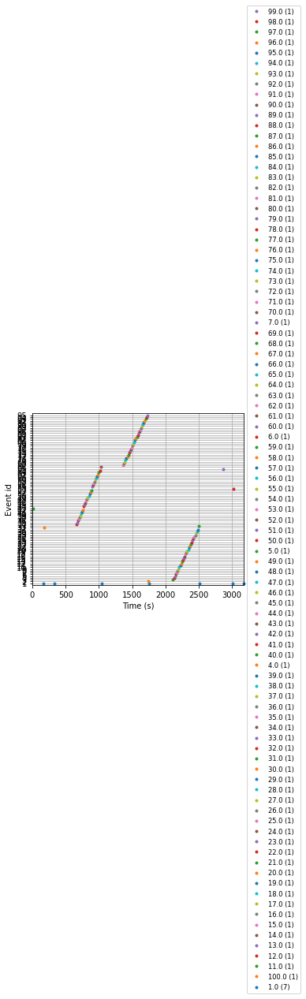

In [49]:
# Visualization of the events across the recording 
# Note I have used the info attribute to get the sampling frequency so I can plot the X axis in terms of seconds 
# Rather then samples
warnings.filterwarnings("ignore", category=RuntimeWarning) 
fig = mne.viz.plot_events(events_from_annot, event_id=event_dict, sfreq=raw.info['sfreq'], first_samp=raw.first_samp)

In [50]:
# Cropping our experimental events based on the first and last event times 
WarmWaterEmersion = raw.copy().crop(tmin=WarmWaterStart, tmax=WarmWaterEnd)
SoundStimuli = raw.copy().crop(tmin=SoundStimuliStart, tmax=SoundStimuliEnd)
HotWaterEmersion = raw.copy().crop(tmin=HotWaterStart, tmax=HotwaterEnd)
EyesOpenStart = raw.copy().crop(tmin=EyesOpenStart, tmax=EyesOpenStartFin)
EyesClosedStart = raw.copy().crop(tmin=EyesClosedStart, tmax=EyesClosedStartFin)
EyesOpenEnd = raw.copy().crop(tmin=EyesOpenEnd, tmax=EyesOpenEndFin)
EyesClosedEnd = raw.copy().crop(tmin=EyesClosedEnd, tmax=EyesClosedEndFin)

In [51]:
events_from_annot, event_dict = mne.events_from_annotations(HotWaterEmersion)

Used Annotations descriptions: ['12.0', '13.0', '14.0', '15.0', '16.0', '17.0', '18.0', '19.0', '20.0', '21.0', '22.0', '23.0', '24.0', '25.0', '26.0', '27.0', '28.0', '29.0', '30.0', '31.0', '32.0', '33.0', '34.0', '35.0', '36.0', '37.0', '38.0', '39.0', '40.0']


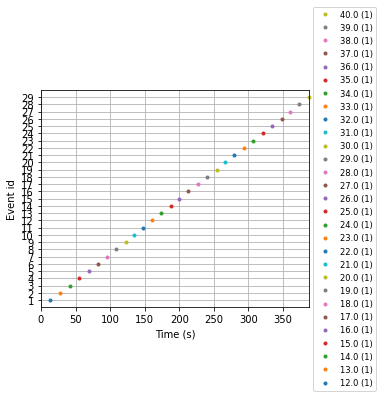

In [52]:
# Visualization of the events across the recording 
# Note I have used the info attribute to get the sampling frequency so I can plot the X axis in terms of seconds 
# Rather then samples
warnings.filterwarnings("ignore", category=RuntimeWarning) 
fig = mne.viz.plot_events(events_from_annot, event_id=event_dict, sfreq=raw.info['sfreq'], first_samp=HotWaterEmersion.first_samp)

In [53]:
# Fixed length epoch each of the newly made epochs at 10 second intervals. 
HW_Epochs = mne.make_fixed_length_epochs(HotWaterEmersion, duration=10, preload=True)
WW_Epochs = mne.make_fixed_length_epochs(WarmWaterEmersion, duration=10, preload=True)
SS_Epochs = mne.make_fixed_length_epochs(SoundStimuli, duration=10, preload=True)
EO_Start_Epochs = mne.make_fixed_length_epochs(EyesOpenStart, duration=10, preload=True)
EC_Start_Epochs = mne.make_fixed_length_epochs(EyesClosedStart, duration=10, preload=True)
EO_End_Epochs = mne.make_fixed_length_epochs(EyesOpenEnd, duration=10, preload=True)
EC_End_Epochs = mne.make_fixed_length_epochs(EyesClosedEnd, duration=10, preload=True)

Not setting metadata
Not setting metadata
38 matching events found
No baseline correction applied
0 projection items activated
Loading data for 38 events and 5000 original time points ...
0 bad epochs dropped
Not setting metadata
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Loading data for 36 events and 5000 original time points ...
0 bad epochs dropped
Not setting metadata
Not setting metadata
30 matching events found
No baseline correction applied
0 projection items activated
Loading data for 30 events and 5000 original time points ...
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
No baseline correction applied
0 projection items activated
Loading data for 14 events and 5000 original time points ...
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
No baseline correction applied
0 projection items activated
Loading data for 14 events and 5000 o

## PSD Charts Ocular events

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows


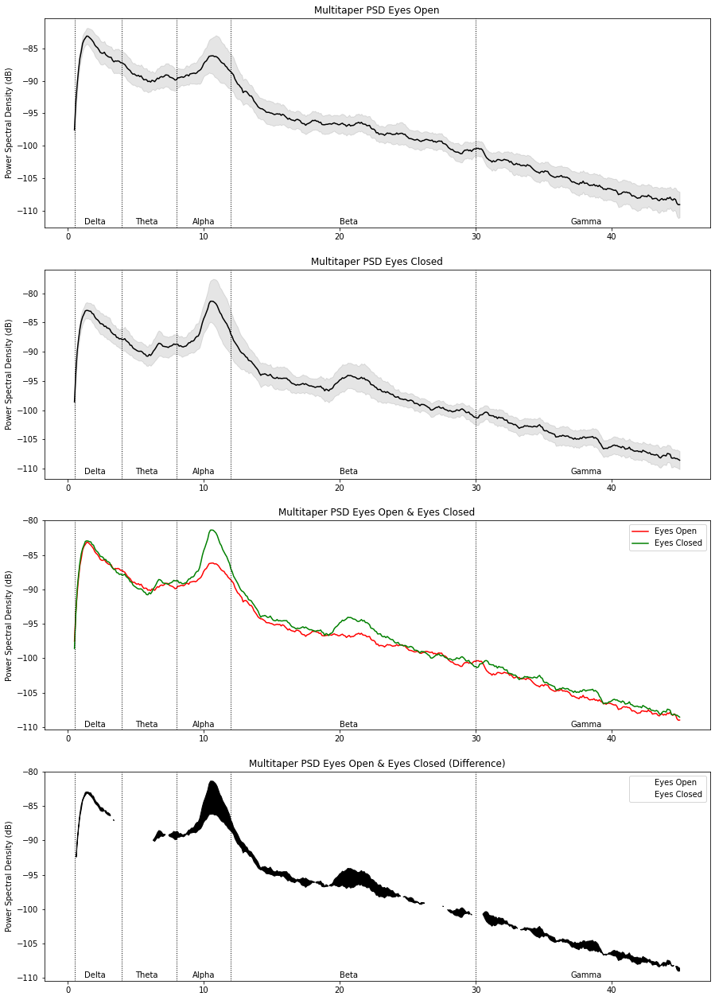

In [54]:
# PSD Chart covering all frequency bands using vertical lines to depict each one 
# These charts are for EO_Start_Epochs, EC_Start_Epochs
# multitaper psds do not scale the data from SI units to more convinient values
# Power in these graphs = (T/m)^2 / HZ as opposed to (fT/cm)^2 / HZ
warnings.filterwarnings("ignore", category=DeprecationWarning)
f, ax = plt.subplots(4, figsize=(15,10))
psds, freqs = psd_multitaper(EO_Start_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds2, freqs2 = psd_multitaper(EC_Start_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds = 10 * np.log10(psds)  # convert to dB
psds_mean = psds.mean(0).mean(0)
psds_std = psds.mean(0).std(0)
psds2 = 10 * np.log10(psds2)  # convert to dB
psds_mean2 = psds2.mean(0).mean(0)
psds_std2 = psds2.mean(0).std(0)


ax[0].plot(freqs, psds_mean, color='k')
ax[0].fill_between(freqs, psds_mean - psds_std, psds_mean + psds_std,color='k', alpha=.1)
# Had to remove the frequency label on x axis otherwise the graph overlapped
ax[0].set(title='Multitaper PSD Eyes Open',ylabel='Power Spectral Density (dB)')
ax[0].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[0].annotate("Delta", (1.2, -112))
ax[0].annotate("Theta", (5, -112))
ax[0].annotate("Alpha", (9.2, -112))
ax[0].annotate("Beta", (20, -112))
ax[0].annotate("Gamma", (37, -112))


ax[1].plot(freqs2, psds_mean2, color='k')
ax[1].fill_between(freqs2, psds_mean2 - psds_std2, psds_mean2 + psds_std2,color='k', alpha=.1)
# Had to remove the frequency label on x axis otherwise the graph overlapped
ax[1].set(title='Multitaper PSD Eyes Closed',ylabel='Power Spectral Density (dB)')
ax[1].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[1].annotate("Delta", (1.2, -111))
ax[1].annotate("Theta", (5, -111))
ax[1].annotate("Alpha", (9.2, -111))
ax[1].annotate("Beta", (20, -111))
ax[1].annotate("Gamma", (37, -111))


ax[2].plot(freqs, psds_mean, color='r', label='Eyes Open')
ax[2].plot(freqs2, psds_mean2, color='g', label='Eyes Closed')
ax[2].legend()
ax[2].set(title='Multitaper PSD Eyes Open & Eyes Closed',ylabel='Power Spectral Density (dB)')
ax[2].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[2].annotate("Delta", (1.2, -110))
ax[2].annotate("Theta", (5, -110))
ax[2].annotate("Alpha", (9.2, -110))
ax[2].annotate("Beta", (20, -110))
ax[2].annotate("Gamma", (37, -110))

ax[3].plot(freqs, psds_mean, color='r', alpha=0, label='Eyes Open')
ax[3].plot(freqs2, psds_mean2, color='g', alpha=0, label='Eyes Closed')
ax[3].legend()
ax[3].set(title='Multitaper PSD Eyes Open & Eyes Closed (Difference)',ylabel='Power Spectral Density (dB)')
ax[3].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[3].annotate("Delta", (1.2, -110))
ax[3].annotate("Theta", (5, -110))
ax[3].annotate("Alpha", (9.2, -110))
ax[3].annotate("Beta", (20, -110))
ax[3].annotate("Gamma", (37, -110))
ax[3].fill_between(freqs, psds_mean, psds_mean2, where=psds_mean < psds_mean2, interpolate=True, color="black")

plt.subplots_adjust(bottom=-.8)

In [55]:
# Power in these graphs = (fT/cm)^2 / HZ
# If you want to look at the frequency bands individually 
# It's essentially a more expanded look at the plots above
# Delta Band
#EO_Start_Epochs.plot_psd(average=True,fmin=0.5, fmax=4)
#EC_Start_Epochs.plot_psd(average=True,fmin=0.5, fmax=4) 
# Theta Band
#EO_Start_Epochs.plot_psd(average=True,fmin=4, fmax=8)
#EC_Start_Epochs.plot_psd(average=True,fmin=4, fmax=8) 
# Alpha Band
#EO_Start_Epochs.plot_psd(average=True,fmin=8, fmax=12)
#EC_Start_Epochs.plot_psd(average=True,fmin=8, fmax=12) 
# Beta Band
#EO_Start_Epochs.plot_psd(average=True,fmin=12, fmax=30)
#EC_Start_Epochs.plot_psd(average=True,fmin=12, fmax=30)
# Gamma Band
#EO_Start_Epochs.plot_psd(average=True,fmin=35, fmax=45)
#EC_Start_Epochs.plot_psd(average=True,fmin=35, fmax=45) 

    Using multitaper spectrum estimation with 7 DPSS windows


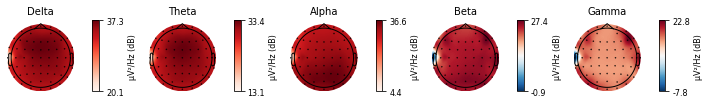

    Using multitaper spectrum estimation with 7 DPSS windows


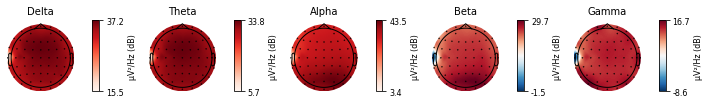

In [56]:
# PSD Scalp Topologies
EO_End_Epochs.plot_psd_topomap(bands = [(0.5, 4, 'Delta'), (4, 8, 'Theta'), (8, 12, 'Alpha'),(12, 30, 'Beta'), (35, 45, 'Gamma')])
EC_End_Epochs.plot_psd_topomap(bands = [(0.5, 4, 'Delta'), (4, 8, 'Theta'), (8, 12, 'Alpha'),(12, 30, 'Beta'), (35, 45, 'Gamma')])
print()

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows


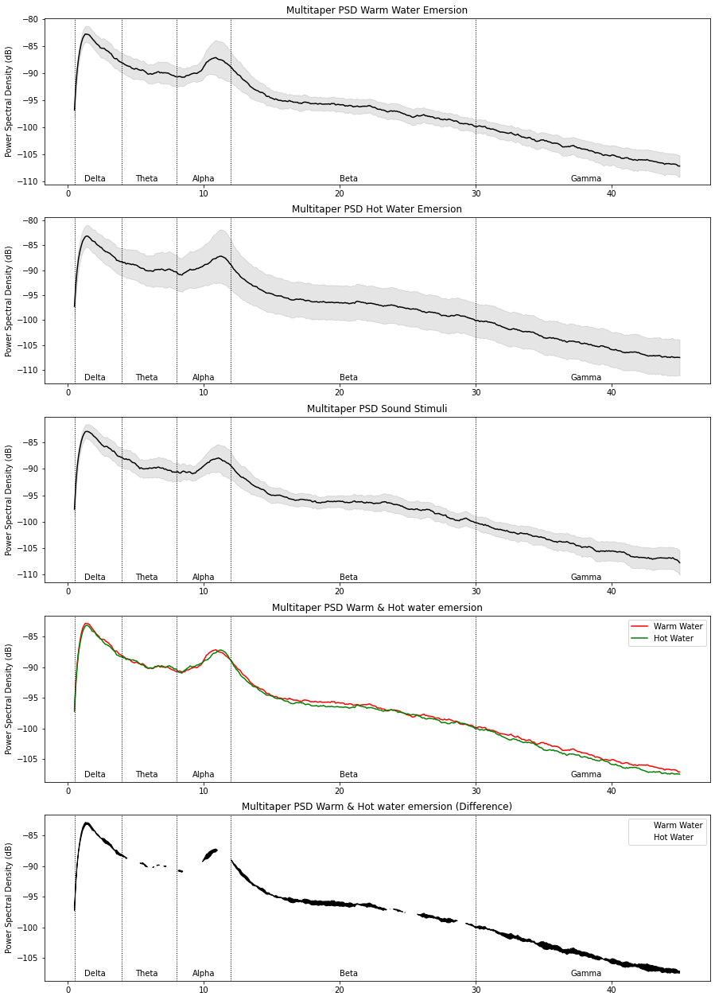

In [57]:
# PSD Chart covering all frequency bands using vertical lines to depict each one 
# These charts are for WW_Epochs, HW_Epochs
# multitaper psds do not scale the data from SI units to more convinient values
# Power in these graphs = (T/m)^2 / HZ as opposed to (fT/cm)^2 / HZ
warnings.filterwarnings("ignore", category=DeprecationWarning)
f, ax = plt.subplots(5, figsize=(15,10))

psds, freqs = psd_multitaper(WW_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds = 10 * np.log10(psds)  # convert to dB
psds_mean = psds.mean(0).mean(0)
psds_std = psds.mean(0).std(0)

psds2, freqs2 = psd_multitaper(HW_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds2 = 10 * np.log10(psds2)  # convert to dB
psds_mean2 = psds2.mean(0).mean(0)
psds_std2 = psds2.mean(0).std(0)

psds3, freqs3 = psd_multitaper(SS_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds3 = 10 * np.log10(psds3)  # convert to dB
psds_mean3 = psds3.mean(0).mean(0)
psds_std3 = psds3.mean(0).std(0)

ax[0].plot(freqs, psds_mean, color='k')
ax[0].fill_between(freqs, psds_mean - psds_std, psds_mean + psds_std,color='k', alpha=.1)
# Had to remove the frequency label on x axis otherwise the graph overlapped
ax[0].set(title='Multitaper PSD Warm Water Emersion',ylabel='Power Spectral Density (dB)')
ax[0].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[0].annotate("Delta", (1.2, -110))
ax[0].annotate("Theta", (5, -110))
ax[0].annotate("Alpha", (9.2, -110))
ax[0].annotate("Beta", (20, -110))
ax[0].annotate("Gamma", (37, -110))


ax[1].plot(freqs2, psds_mean2, color='k')
ax[1].fill_between(freqs2, psds_mean2 - psds_std2, psds_mean2 + psds_std2,color='k', alpha=.1)
# Had to remove the frequency label on x axis otherwise the graph overlapped
ax[1].set(title='Multitaper PSD Hot Water Emersion',ylabel='Power Spectral Density (dB)')
ax[1].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[1].annotate("Delta", (1.2, -112))
ax[1].annotate("Theta", (5, -112))
ax[1].annotate("Alpha", (9.2, -112))
ax[1].annotate("Beta", (20, -112))
ax[1].annotate("Gamma", (37, -112))

ax[2].plot(freqs3, psds_mean3, color='k')
ax[2].fill_between(freqs3, psds_mean3 - psds_std3, psds_mean3 + psds_std3,color='k', alpha=.1)
# Had to remove the frequency label on x axis otherwise the graph overlapped
ax[2].set(title='Multitaper PSD Sound Stimuli',ylabel='Power Spectral Density (dB)')
ax[2].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[2].annotate("Delta", (1.2, -111))
ax[2].annotate("Theta", (5, -111))
ax[2].annotate("Alpha", (9.2, -111))
ax[2].annotate("Beta", (20, -111))
ax[2].annotate("Gamma", (37, -111))

ax[3].plot(freqs, psds_mean, color='r', label='Warm Water')
ax[3].plot(freqs2, psds_mean2, color='g', label='Hot Water')
#ax[3].plot(freqs3, psds_mean3, color='b', label='Sound Stimuli')
ax[3].legend()
ax[3].set(title='Multitaper PSD Warm & Hot water emersion',ylabel='Power Spectral Density (dB)')
ax[3].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[3].annotate("Delta", (1.2, -108))
ax[3].annotate("Theta", (5, -108))
ax[3].annotate("Alpha", (9.2, -108))
ax[3].annotate("Beta", (20, -108))
ax[3].annotate("Gamma", (37, -108))

ax[4].plot(freqs, psds_mean, color='r', alpha=0, label='Warm Water')
ax[4].plot(freqs2, psds_mean2, color='g', alpha=0, label='Hot Water')
#ax[3].plot(freqs3, psds_mean3, color='b', label='Sound Stimuli')
ax[4].legend()
ax[4].set(title='Multitaper PSD Warm & Hot water emersion (Difference)',ylabel='Power Spectral Density (dB)')
ax[4].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[4].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[4].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[4].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[4].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[4].annotate("Delta", (1.2, -108))
ax[4].annotate("Theta", (5, -108))
ax[4].annotate("Alpha", (9.2, -108))
ax[4].annotate("Beta", (20, -108))
ax[4].annotate("Gamma", (37, -108))
ax[4].fill_between(freqs, psds_mean, psds_mean2, where=psds_mean2 < psds_mean, interpolate=True, color="black")

plt.subplots_adjust(bottom=-.8)

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows


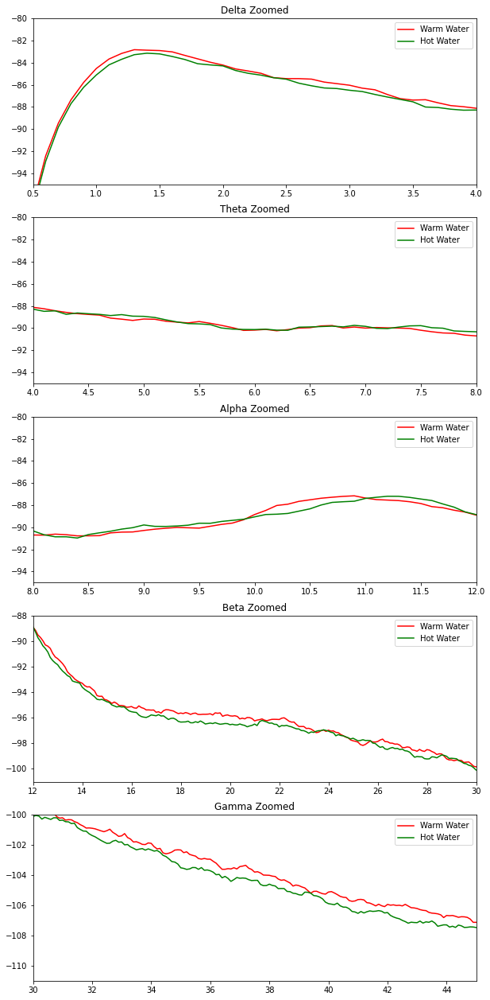

In [58]:
# These are essentially just zoomed in versions of our previous graphs
warnings.filterwarnings("ignore", category=DeprecationWarning)
f, ax = plt.subplots(5, figsize=(10,10))
psds, freqs = psd_multitaper(WW_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds = 10 * np.log10(psds)  # convert to dB
psds_mean = psds.mean(0).mean(0)
psds_std = psds.mean(0).std(0)
psds2, freqs2 = psd_multitaper(HW_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds2 = 10 * np.log10(psds2)  # convert to dB
psds_mean2 = psds2.mean(0).mean(0)
psds_std2 = psds2.mean(0).std(0)
psds3, freqs3 = psd_multitaper(SS_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds3 = 10 * np.log10(psds3)  # convert to dB
psds_mean3 = psds3.mean(0).mean(0)
psds_std3 = psds3.mean(0).std(0)

ax[0].plot(freqs, psds_mean, color='r', label='Warm Water')
ax[0].axis([0.5, 4, -95, -80])
ax[0].plot(freqs, psds_mean2, color='g', label='Hot Water')
ax[0].legend()
ax[0].set(title='Delta Zoomed')

ax[1].plot(freqs, psds_mean, color='r', label='Warm Water')
ax[1].axis([4, 8, -95, -80])
ax[1].plot(freqs, psds_mean2, color='g', label='Hot Water')
ax[1].legend()
ax[1].set(title='Theta Zoomed')

ax[2].plot(freqs, psds_mean, color='r', label='Warm Water')
ax[2].axis([8, 12, -95, -80])
ax[2].plot(freqs, psds_mean2, color='g', label='Hot Water')
ax[2].legend()
ax[2].set(title='Alpha Zoomed')

ax[3].plot(freqs, psds_mean, color='r', label='Warm Water')
ax[3].axis([12, 30, -101, -88])
ax[3].plot(freqs, psds_mean2, color='g', label='Hot Water')
ax[3].legend()
ax[3].set(title='Beta Zoomed')

ax[4].plot(freqs, psds_mean, color='r', label='Warm Water')
ax[4].axis([30, 45, -111, -100])
ax[4].plot(freqs, psds_mean2, color='g', label='Hot Water')
ax[4].legend()
ax[4].set(title='Gamma Zoomed')

plt.subplots_adjust(bottom=-.8)

## PSD Charts Major experimental events

In [59]:
# Power in these graphs = (fT/cm)^2 / HZ
# If you want to look at the frequency bands individually 
# It's essentially a more expanded look at the plots above
# Delta Band
#WW_Epochs.plot_psd(average=True,fmin=0.5, fmax=4)
#HW_Epochs.plot_psd(average=True,fmin=0.5, fmax=4) 
#SS_Epochs.plot_psd(average=True,fmin=0.5, fmax=4) 
# Theta Band
#WW_Epochs.plot_psd(average=True,fmin=4, fmax=8)
#HW_Epochs.plot_psd(average=True,fmin=4, fmax=8) 
#SS_Epochs.plot_psd(average=True,fmin=4, fmax=8) 
# Alpha Band
#WW_Epochs.plot_psd(average=True,fmin=8, fmax=12)
#HW_Epochs.plot_psd(average=True,fmin=8, fmax=12) 
#SS_Epochs.plot_psd(average=True,fmin=8, fmax=12) 
# Beta Band
#WW_Epochs.plot_psd(average=True,fmin=12, fmax=30)
#HW_Epochs.plot_psd(average=True,fmin=12, fmax=30)
#SS_Epochs.plot_psd(average=True,fmin=12, fmax=30)
# Gamma Band
#WW_Epochs.plot_psd(average=True,fmin=35, fmax=45)
#HW_Epochs.plot_psd(average=True,fmin=35, fmax=45) 
#SS_Epochs.plot_psd(average=True,fmin=35, fmax=45) 
print()

    Using multitaper spectrum estimation with 7 DPSS windows


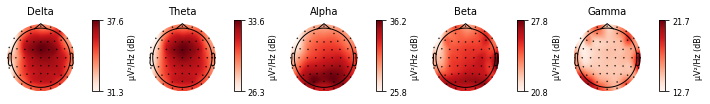

    Using multitaper spectrum estimation with 7 DPSS windows


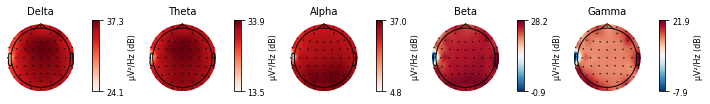

    Using multitaper spectrum estimation with 7 DPSS windows


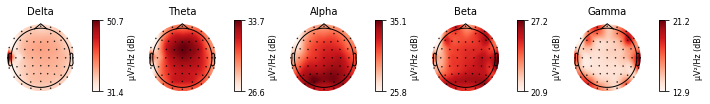

In [60]:
# PSD Scalp Topologies
# Indicate frequency power for each experimental event
WW_Epochs.plot_psd_topomap(bands = [(0.5, 4, 'Delta'), (4, 8, 'Theta'), (8, 12, 'Alpha'),(12, 30, 'Beta'), (35, 45, 'Gamma')])
HW_Epochs.plot_psd_topomap(bands = [(0.5, 4, 'Delta'), (4, 8, 'Theta'), (8, 12, 'Alpha'),(12, 30, 'Beta'), (35, 45, 'Gamma')])
SS_Epochs.plot_psd_topomap(bands = [(0.5, 4, 'Delta'), (4, 8, 'Theta'), (8, 12, 'Alpha'),(12, 30, 'Beta'), (35, 45, 'Gamma')])
print()

### Additional Models (Eyes Open vs Hot water Emersion)

In the case that the differences between hot water emersion and warm water emersion are too subtle for our machine learning models to handle, we could explore the classification between eyes open and hot water emersion instead as the distinction between the two is more prominent

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows


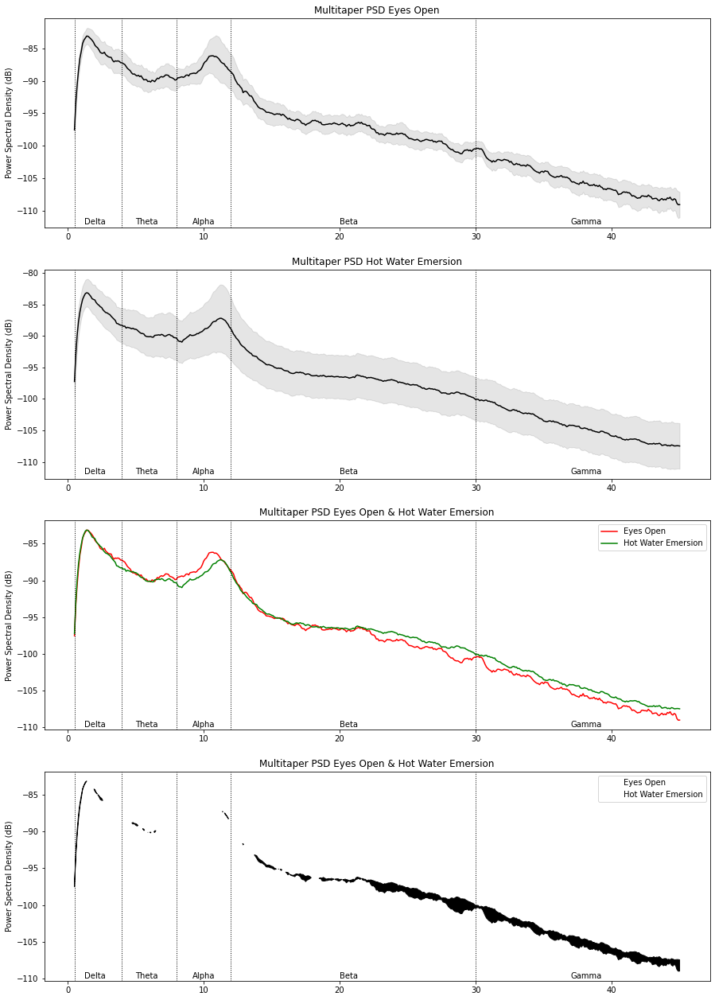

In [61]:
# These charts are for EO_Start_Epochs, Hot Water Emersion
warnings.filterwarnings("ignore", category=DeprecationWarning)
f, ax = plt.subplots(4, figsize=(15,10))

psds, freqs = psd_multitaper(EO_Start_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds = 10 * np.log10(psds)  # convert to dB
psds_mean = psds.mean(0).mean(0)
psds_std = psds.mean(0).std(0)

psds2, freqs2 = psd_multitaper(HW_Epochs, fmin=0.5, fmax=45, n_jobs=1)
psds2 = 10 * np.log10(psds2)  # convert to dB
psds_mean2 = psds2.mean(0).mean(0)
psds_std2 = psds2.mean(0).std(0)

ax[0].plot(freqs, psds_mean, color='k')
ax[0].fill_between(freqs, psds_mean - psds_std, psds_mean + psds_std,color='k', alpha=.1)
# Had to remove the frequency label on x axis otherwise the graph overlapped
ax[0].set(title='Multitaper PSD Eyes Open',ylabel='Power Spectral Density (dB)')
ax[0].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[0].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[0].annotate("Delta", (1.2, -112))
ax[0].annotate("Theta", (5, -112))
ax[0].annotate("Alpha", (9.2, -112))
ax[0].annotate("Beta", (20, -112))
ax[0].annotate("Gamma", (37, -112))


ax[1].plot(freqs2, psds_mean2, color='k')
ax[1].fill_between(freqs2, psds_mean2 - psds_std2, psds_mean2 + psds_std2,color='k', alpha=.1)
# Had to remove the frequency label on x axis otherwise the graph overlapped
ax[1].set(title='Multitaper PSD Hot Water Emersion',ylabel='Power Spectral Density (dB)')
ax[1].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[1].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[1].annotate("Delta", (1.2, -112))
ax[1].annotate("Theta", (5, -112))
ax[1].annotate("Alpha", (9.2, -112))
ax[1].annotate("Beta", (20, -112))
ax[1].annotate("Gamma", (37, -112))


ax[2].plot(freqs, psds_mean, color='r', label='Eyes Open')
ax[2].plot(freqs2, psds_mean2, color='g', label='Hot Water Emersion')
ax[2].legend()
ax[2].set(title='Multitaper PSD Eyes Open & Hot Water Emersion',ylabel='Power Spectral Density (dB)')
ax[2].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[2].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[2].annotate("Delta", (1.2, -110))
ax[2].annotate("Theta", (5, -110))
ax[2].annotate("Alpha", (9.2, -110))
ax[2].annotate("Beta", (20, -110))
ax[2].annotate("Gamma", (37, -110))

ax[3].plot(freqs, psds_mean, color='r', alpha=0, label='Eyes Open')
ax[3].plot(freqs2, psds_mean2, color='g', alpha=0, label='Hot Water Emersion')
ax[3].legend()
ax[3].set(title='Multitaper PSD Eyes Open & Hot Water Emersion',ylabel='Power Spectral Density (dB)')
ax[3].axvline(x=0.5, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=4, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=8, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=12, linewidth=1, color='black',linestyle=":")
ax[3].axvline(x=30, linewidth=1, color='black',linestyle=":")
ax[3].annotate("Delta", (1.2, -110))
ax[3].annotate("Theta", (5, -110))
ax[3].annotate("Alpha", (9.2, -110))
ax[3].annotate("Beta", (20, -110))
ax[3].annotate("Gamma", (37, -110))
ax[3].fill_between(freqs, psds_mean, psds_mean2, where=psds_mean < psds_mean2, interpolate=True, color="black")

plt.subplots_adjust(bottom=-.8)

### Choosing the Best Channels / Regions of interest

Now that we've taken an overview of the discrepencies between frequency bands of the experiment events, we can look in more depth at the individual channels that are responsible for the most useful representations; we do this because out of the 63 channels, some may contain more useful information about the frequency bands than others which may just contain noisy data. The goal here is to reduce our feature space as much as possible for our machine learning models, to help them cope better with the training process

In [62]:
# List channels 
print(HW_Epochs.ch_names)

['FP1', 'FPZ', 'FP2', 'AF7', 'AF3', 'AF4', 'AF8', 'F7', 'F5', 'F3', 'F1', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FT7', 'FC5', 'FC3', 'FC1', 'FCZ', 'FC2', 'FC4', 'FC6', 'FT8', 'T7', 'C5', 'C3', 'C1', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPZ', 'CP2', 'CP4', 'CP6', 'TP8', 'P7', 'P5', 'P3', 'P1', 'PZ', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO3', 'POZ', 'PO4', 'PO8', 'O1', 'OZ', 'O2']


In [63]:
warnings.filterwarnings("ignore", category=DeprecationWarning)

Channels_Delta, Channels_Theta, Channels_Alpha, Channels_Beta, Channels_Gamma = order_channels(EO_Start_Epochs, EC_Start_Epochs)
# FOR EXAMPLE IN THE FIRST LOOP
# 1. Obtain mean power spectral densities for channel FP1 in the Delta frequency band during the eyes open event
# 2. Obtain mean power spectral densities for channel FP1 in the Delta frequency band during the eyes closed event
# 3. Subtract the result of step one, from the result of step 2, for a single list of the differences between the two
# 4. Then calculate the mean of the differences in the new list (abs the negative values)
# 5. Place it in it's respective list so we can organize which results are which. 

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

### Optimal Channels for Eyes Open vs Eyes Closed

Now that we have the average differences between all channels and frequency bands in each experimental event, we can sort them and find out which channels are responsible for the greatest differences in each frequency band. 

In [64]:
for x in range(10):
    print(sorted(Channels_Delta, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Delta, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Delta, key=itemgetter(2), reverse=True)[x][2])

F4 Delta 0.8622391867265908
AF4 Delta 0.8552767763349867
FC4 Delta 0.8126327294246656
F2 Delta 0.7673011950764005
F6 Delta 0.7555113998994069
FC2 Delta 0.7503282467886395
FC6 Delta 0.708181694343224
FZ Delta 0.691458046796443
AF3 Delta 0.6865294010356008
FC3 Delta 0.6758453746093441


In [65]:
for x in range(10):
    print(sorted(Channels_Theta, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Theta, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Theta, key=itemgetter(2), reverse=True)[x][2])

FC4 Theta 0.7250305122918953
F4 Theta 0.7179664924031901
FC2 Theta 0.7142645716288738
AF4 Theta 0.7132223893597047
FCZ Theta 0.684764192918463
F2 Theta 0.6813770688335724
PO4 Theta 0.6733480910513246
F6 Theta 0.6721052455123859
PO7 Theta 0.6639209791346325
P6 Theta 0.6548379944296283


In [66]:
for x in range(10):
    print(sorted(Channels_Alpha, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Alpha, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Alpha, key=itemgetter(2), reverse=True)[x][2])

POZ Alpha 2.074910155341619
PO4 Alpha 1.9046505927976023
O2 Alpha 1.7853980708021788
PO8 Alpha 1.7227759997200935
OZ Alpha 1.610199507884617
PO3 Alpha 1.5849626706198991
O1 Alpha 1.5043055019473555
PO7 Alpha 1.4876183219150656
P6 Alpha 1.2737152956237803
P8 Alpha 1.214072033457348


In [67]:
for x in range(10):
    print(sorted(Channels_Beta, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Beta, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Beta, key=itemgetter(2), reverse=True)[x][2])

O2 Beta 2.267351803425631
PO4 Beta 2.259925497163495
POZ Beta 2.177302288524385
OZ Beta 2.048949404071495
PO3 Beta 2.0321297168643793
O1 Beta 1.8727629004965782
PO8 Beta 1.6981024026586424
PO7 Beta 1.6193576658616937
P6 Beta 1.5635151640455704
P5 Beta 1.5004506566243294


In [68]:
for x in range(10):
    print(sorted(Channels_Gamma, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Gamma, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Gamma, key=itemgetter(2), reverse=True)[x][2])

T8 Gamma 1.8984452898089323
O2 Gamma 1.7720123751261216
PO4 Gamma 1.7511047001566111
POZ Gamma 1.6446220618364937
OZ Gamma 1.5505191413615675
PO3 Gamma 1.5388730909262085
O1 Gamma 1.4018853223382064
PO8 Gamma 1.345164480430349
F5 Gamma 1.3195770327511551
P5 Gamma 1.3132791514693236


### Optimal Channels for Hot Water Submersion vs Warm Water Submersion 

In [69]:
warnings.filterwarnings("ignore", category=DeprecationWarning)

Channels_Delta, Channels_Theta, Channels_Alpha, Channels_Beta, Channels_Gamma = order_channels(HW_Epochs, WW_Epochs, Details=True)
# FOR EXAMPLE IN THE FIRST LOOP
# 1. Obtain mean power spectral densities for channel FP1 in the Delta frequency band during the eyes open event
# 2. Obtain mean power spectral densities for channel FP1 in the Delta frequency band during the eyes closed event
# 3. Subtract the result of step one, from the result of step 2, for a single list of the differences between the two
# 4. Then calculate the mean of the differences in the new list (abs the negative values)
# 5. Place it in it's respective list so we can organize which results are which. 

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

In [70]:
for x in range(10):
    print(sorted(Channels_Delta, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Delta, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Delta, key=itemgetter(2), reverse=True)[x][2])

AF8 Delta 0.9589639335229219
AF7 Delta 0.6316212652618067
FP2 Delta 0.4919878232135646
FP1 Delta 0.4760865219934593
O2 Delta 0.47500010483983685
OZ Delta 0.44967743666726556
O1 Delta 0.44629216291429624
PO8 Delta 0.4364635047479246
PO7 Delta 0.42306863777523496
PO4 Delta 0.4145363922074105


In [71]:
for x in range(10):
    print(sorted(Channels_Theta, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Theta, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Theta, key=itemgetter(2), reverse=True)[x][2])

AF8 Theta 0.5531467104124578
O1 Theta 0.5392171434670561
FT8 Theta 0.5176103213613525
P7 Theta 0.513045759927386
PO7 Theta 0.5128623746117531
FT7 Theta 0.508724617039984
O2 Theta 0.5071978833312084
PO8 Theta 0.5056159236902431
OZ Theta 0.5010837040092592
AF7 Theta 0.4999322817720961


In [72]:
for x in range(10):
    print(sorted(Channels_Alpha, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Alpha, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Alpha, key=itemgetter(2), reverse=True)[x][2])

PO7 Alpha 0.6392330685454528
O1 Alpha 0.638090568521438
P7 Alpha 0.60268382538608
PO8 Alpha 0.5670362891200125
P5 Alpha 0.5539852918089523
FT7 Alpha 0.545366106406008
OZ Alpha 0.5420378374377224
PO3 Alpha 0.5411201062552612
O2 Alpha 0.5399745056478195
P8 Alpha 0.5349773321818636


In [73]:
for x in range(10):
    print(sorted(Channels_Beta, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Beta, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Beta, key=itemgetter(2), reverse=True)[x][2])

TP7 Beta 0.7149590446780509
T8 Beta 0.5962131314058933
FP1 Beta 0.5771656195706767
FT8 Beta 0.5595902270685211
PO7 Beta 0.5355262965603089
C5 Beta 0.5345034408964916
FT7 Beta 0.5188846119804137
O1 Beta 0.5187853306994052
P8 Beta 0.5139362527373281
F5 Beta 0.5026287572466879


In [74]:
for x in range(10):
    print(sorted(Channels_Gamma, key=itemgetter(2), reverse=True)[x][0], sorted(Channels_Gamma, key=itemgetter(2), reverse=True)[x][1], sorted(Channels_Gamma, key=itemgetter(2), reverse=True)[x][2])

TP7 Gamma 0.848396866449992
P8 Gamma 0.7372413768248185
FT7 Gamma 0.6859340593665287
F5 Gamma 0.628667601368463
FP1 Gamma 0.6242103292745071
FT8 Gamma 0.5649478981437039
C5 Gamma 0.5280714090235195
T8 Gamma 0.5274520564072959
PO7 Gamma 0.5216521930830182
O1 Gamma 0.49133431268459127


In [75]:
Channels_Delta, Channels_Theta, Channels_Alpha, Channels_Beta, Channels_Gamma = order_channels(EO_Start_Epochs, EC_Start_Epochs, Details=False)

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

In [76]:
# In this block, I'm basically redoing what I've done before, but creating a list
# of power spectral densities for each frequency band with useless channel data
# removed.

PSDS_FOR_EO_OPTIMIZED = []
PSDS_FOR_EC_OPTIMIZED = []

Frequency_Band_Lower_Bound = [0.5, 4, 8, 12, 35]
Frequency_Band_Upper_Bound = [4, 8, 12, 30, 45,]
Optimal_Channels = [Channels_Delta, Channels_Theta, Channels_Alpha, Channels_Beta, Channels_Gamma]
for i in range(len(Frequency_Band_Lower_Bound)):
    psds, freqs = psd_multitaper(EO_Start_Epochs, fmin=Frequency_Band_Lower_Bound[i], fmax=Frequency_Band_Upper_Bound[i], n_jobs=1, picks=Optimal_Channels[i][1:10])
    psds = 10 * np.log10(psds)  # convert to dB
    psds_mean = psds.mean(0).mean(0)
    PSDS_FOR_EO_OPTIMIZED.append(psds_mean)

    psds2, freqs2 = psd_multitaper(EC_Start_Epochs, fmin=Frequency_Band_Lower_Bound[i], fmax=Frequency_Band_Upper_Bound[i], n_jobs=1, picks=Optimal_Channels[i][1:10])
    psds2 = 10 * np.log10(psds2)  # convert to dB
    psds_mean2 = psds2.mean(0).mean(0)
    PSDS_FOR_EC_OPTIMIZED.append(psds_mean2)
        
# The format of the output lists are essentially

# PSDS_FOR_EO_OPTIMIZED = [PSDS_Delta, PSDS_Theta, PSDS_Alpha, PSDS_Beta, PSDS_Gamma]
# and the same for eyes closed
# Now we can look to model them against each other. 

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows


### Boxplots for our optimized data (Eyes open vs Eyes closed)

Now that we've removed the redundant channels. We can now plot our boxplots are observe whether our medians are far enough apart to be able to yield some interesting results. 

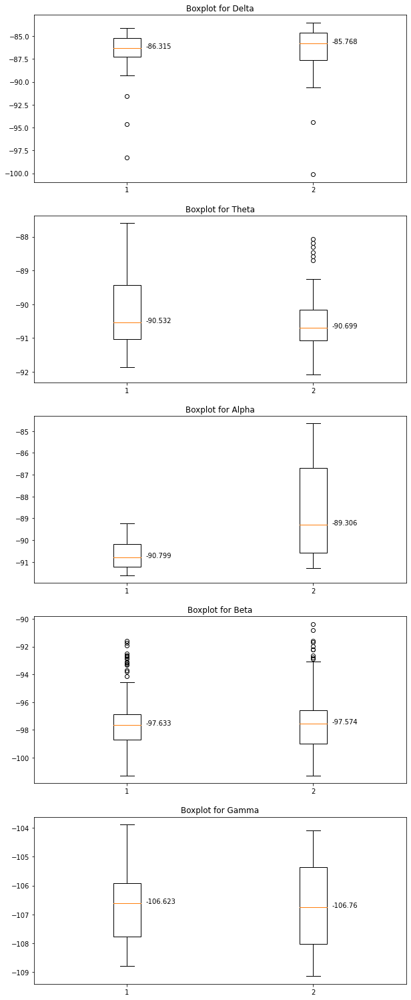

In [77]:
fig, axs = plt.subplots(5, 1 ,figsize=(10, 7))
# Delta
axs[0].set_title("Boxplot for Delta")
bp_d = axs[0].boxplot([PSDS_FOR_EO_OPTIMIZED[0], PSDS_FOR_EC_OPTIMIZED[0]])
medians_delta = [item.get_ydata()[0] for item in bp_d['medians']]
axs[0].annotate(round(medians_delta[0], 3), (1.1, medians_delta[0]))
axs[0].annotate(round(medians_delta[1], 3), (2.1, medians_delta[1]))

# Theta
axs[1].set_title("Boxplot for Theta")
bp_t = axs[1].boxplot([PSDS_FOR_EO_OPTIMIZED[1], PSDS_FOR_EC_OPTIMIZED[1]])
medians_theta = [item.get_ydata()[0] for item in bp_t['medians']]
axs[1].annotate(round(medians_theta[0], 3), (1.1, medians_theta[0]))
axs[1].annotate(round(medians_theta[1], 3), (2.1, medians_theta[1]))

# Alpha
axs[2].set_title("Boxplot for Alpha")
bp_a = axs[2].boxplot([PSDS_FOR_EO_OPTIMIZED[2], PSDS_FOR_EC_OPTIMIZED[2]])
medians_alpha = [item.get_ydata()[0] for item in bp_a['medians']]
axs[2].annotate(round(medians_alpha[0], 3), (1.1, medians_alpha[0]))
axs[2].annotate(round(medians_alpha[1], 3), (2.1, medians_alpha[1]))

# Beta
axs[3].set_title("Boxplot for Beta")
bp_b = axs[3].boxplot([PSDS_FOR_EO_OPTIMIZED[3], PSDS_FOR_EC_OPTIMIZED[3]])
medians_beta = [item.get_ydata()[0] for item in bp_b['medians']]
axs[3].annotate(round(medians_beta[0], 3), (1.1, medians_beta[0]))
axs[3].annotate(round(medians_beta[1], 3), (2.1, medians_beta[1]))

# Gamma 
axs[4].set_title("Boxplot for Gamma")
bp_g = axs[4].boxplot([PSDS_FOR_EO_OPTIMIZED[4], PSDS_FOR_EC_OPTIMIZED[4]])
medians_gamma = [item.get_ydata()[0] for item in bp_g['medians']]
axs[4].annotate(round(medians_gamma[0], 3), (1.1, medians_gamma[0]))
axs[4].annotate(round(medians_gamma[1], 3), (2.1, medians_gamma[1]))

plt.subplots_adjust(bottom=-2)

### Boxplots for our optimized data (Hot Water Emersion vs Warm Water Emersion)

In [78]:
Channels_Delta, Channels_Theta, Channels_Alpha, Channels_Beta, Channels_Gamma = order_channels(HW_Epochs, WW_Epochs, Details=False)

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

In [79]:
# In this block, I'm basically redoing what I've done before, but creating a list
# of power spectral densities for each frequency band with useless channel data
# removed.

PSDS_FOR_HW_OPTIMIZED = []
PSDS_FOR_WW_OPTIMIZED = []

Frequency_Band_Lower_Bound = [0.5, 4, 8, 12, 35]
Frequency_Band_Upper_Bound = [4, 8, 12, 30, 45,]
Optimal_Channels = [Channels_Delta, Channels_Theta, Channels_Alpha, Channels_Beta, Channels_Gamma]
for i in range(len(Frequency_Band_Lower_Bound)):
    psds, freqs = psd_multitaper(HW_Epochs, fmin=Frequency_Band_Lower_Bound[i], fmax=Frequency_Band_Upper_Bound[i], n_jobs=1, picks=Optimal_Channels[i][1:10])
    psds = 10 * np.log10(psds)  # convert to dB
    psds_mean = psds.mean(0).mean(0)
    PSDS_FOR_HW_OPTIMIZED.append(psds_mean)

    psds2, freqs2 = psd_multitaper(WW_Epochs, fmin=Frequency_Band_Lower_Bound[i], fmax=Frequency_Band_Upper_Bound[i], n_jobs=1, picks=Optimal_Channels[i][1:10])
    psds2 = 10 * np.log10(psds2)  # convert to dB
    psds_mean2 = psds2.mean(0).mean(0)
    PSDS_FOR_WW_OPTIMIZED.append(psds_mean2)
        
# The format of the output lists are essentially

# PSDS_FOR_EO_OPTIMIZED = [PSDS_Delta, PSDS_Theta, PSDS_Alpha, PSDS_Beta, PSDS_Gamma]
# and the same for eyes closed
# Now we can look to model them against each other. 

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows


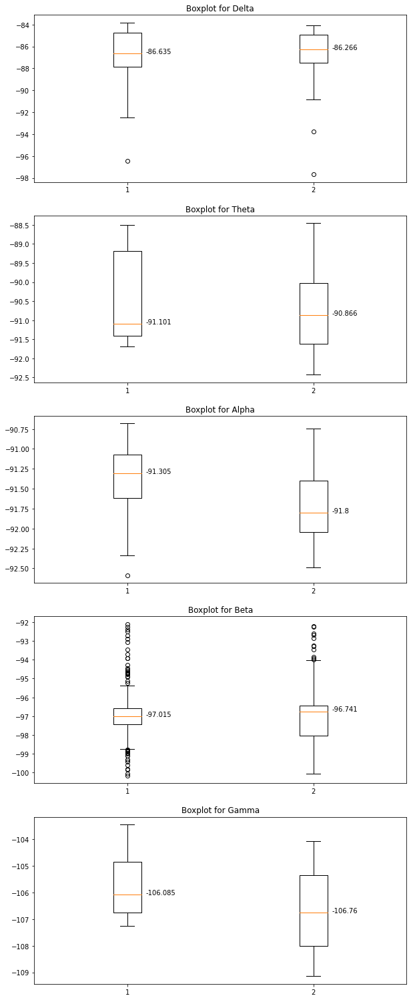

In [80]:
fig, axs = plt.subplots(5, 1 ,figsize=(10, 7))
# Delta
axs[0].set_title("Boxplot for Delta")
bp_d = axs[0].boxplot([PSDS_FOR_HW_OPTIMIZED[0], PSDS_FOR_WW_OPTIMIZED[0]])
medians_delta = [item.get_ydata()[0] for item in bp_d['medians']]
axs[0].annotate(round(medians_delta[0], 3), (1.1, medians_delta[0]))
axs[0].annotate(round(medians_delta[1], 3), (2.1, medians_delta[1]))

# Theta
axs[1].set_title("Boxplot for Theta")
bp_t = axs[1].boxplot([PSDS_FOR_HW_OPTIMIZED[1], PSDS_FOR_WW_OPTIMIZED[1]])
medians_theta = [item.get_ydata()[0] for item in bp_t['medians']]
axs[1].annotate(round(medians_theta[0], 3), (1.1, medians_theta[0]))
axs[1].annotate(round(medians_theta[1], 3), (2.1, medians_theta[1]))

# Alpha
axs[2].set_title("Boxplot for Alpha")
bp_a = axs[2].boxplot([PSDS_FOR_HW_OPTIMIZED[2], PSDS_FOR_WW_OPTIMIZED[2]])
medians_alpha = [item.get_ydata()[0] for item in bp_a['medians']]
axs[2].annotate(round(medians_alpha[0], 3), (1.1, medians_alpha[0]))
axs[2].annotate(round(medians_alpha[1], 3), (2.1, medians_alpha[1]))

# Beta
axs[3].set_title("Boxplot for Beta")
bp_b = axs[3].boxplot([PSDS_FOR_HW_OPTIMIZED[3], PSDS_FOR_WW_OPTIMIZED[3]])
medians_beta = [item.get_ydata()[0] for item in bp_b['medians']]
axs[3].annotate(round(medians_beta[0], 3), (1.1, medians_beta[0]))
axs[3].annotate(round(medians_beta[1], 3), (2.1, medians_beta[1]))

# Gamma 
axs[4].set_title("Boxplot for Gamma")
bp_g = axs[4].boxplot([PSDS_FOR_HW_OPTIMIZED[4], PSDS_FOR_EC_OPTIMIZED[4]])
medians_gamma = [item.get_ydata()[0] for item in bp_g['medians']]
axs[4].annotate(round(medians_gamma[0], 3), (1.1, medians_gamma[0]))
axs[4].annotate(round(medians_gamma[1], 3), (2.1, medians_gamma[1]))

plt.subplots_adjust(bottom=-2)

In [81]:
# Our end goal here is a numpy array that is trials x channels x frequencies 
# So we loop through our conditions, then loop through each trial in each 
# Condition. Then we calculate the psds for that trial in the form (channels x frequencies)
# Then we concatenate a label to the end so we can keep track of where it comes
# from. Then we add it to our global list. 
#Conditions = [HW_Epochs, WW_Epochs, EO_Start_Epochs, EC_Start_Epochs, SS_Epochs, EO_End_Epochs, EC_End_Epochs]   
#Conditions = [EO_Start_Epochs, EC_Start_Epochs]
Conditions = [HW_Epochs, WW_Epochs]

Global_List_Of_Data= []
for condition in Conditions:
    for trial_number in range(len(condition)):
        psds, freqs = psd_multitaper(condition[trial_number], fmin=1, fmax=40, n_jobs=1)
        Current = list(psds[0])
        if condition == HW_Epochs:
            Current.append(0)
        elif condition == WW_Epochs:
            Current.append(1)
        elif condition == EO_Start_Epochs:
            Current.append(2)
        elif condition == EC_Start_Epochs:
            Current.append(3)
        elif condition == SS_Epochs:
            Current.append(4)
        elif condition == EO_End_Epochs:
            Current.append(5)
        elif condition == EC_End_Epochs:
            Current.append(6)
        Global_List_Of_Data.append(Current)

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

In [82]:
# Because we are working with numpy arrays I have manually shuffled our results.
# Once it's shuffled I can extract our concatented labels
# So that we now have Global_List_Of_Data which is all our training data
# and we now have Labels which is all our labels
# Both of which are in the same order (even after having been shuffled)
np.random.shuffle(Global_List_Of_Data)
Labels = []
for i in range(len(Global_List_Of_Data)):
    Labels.append(Global_List_Of_Data[i][-1])
    Global_List_Of_Data[i] = Global_List_Of_Data[i][:-1]


In [83]:
# Old training / testing split. This isn't used anymore. Instead we just use cross validation functions
Split_Ratio = round(len(Global_List_Of_Data) * 0.8)
print(Split_Ratio)
training_X, test_X, training_Y, test_Y = Global_List_Of_Data[:Split_Ratio], Global_List_Of_Data[Split_Ratio:],Labels[:Split_Ratio],Labels[Split_Ratio:]

59


In [84]:
X = np.asarray(Global_List_Of_Data)
y = np.asarray(Labels)

In [85]:
# FOR COMMON SPATIAL PATTERNS + SUPPORT VECTOR MACHINE

# Define our common spatial filters and our classifier model
clf = SVC(kernel='linear') # Linear Kernel
csp = CSP(n_components=4)
# Make a pipeline from the given estimators
# This pipeline will sequentially apply a list of transformations and a final 
# estimator.
classifier_pipeline_CSP = make_pipeline(csp,clf)

# Cross validation split. 
cv = StratifiedKFold(n_splits=10, shuffle=True)

# Now we can calculate the cross validation scores when applying our training
# data to the newly made pipeline
scores_CSP = cross_val_score(classifier_pipeline_CSP, X, y, cv=cv)

print(" CSP + SVM Classification accuracy: %f" % (np.mean(scores_CSP)))

Computing rank from data with rank=None
    Using tolerance 1.9e-08 (2.2e-16 eps * 60 dim * 1.5e+06  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 1.9e-08 (2.2e-16 eps * 60 dim * 1.4e+06  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 1.8e-08 (2.2e-16 eps * 60 dim * 1.4e+06  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 1.9e-08 (2.2e-16 eps * 60 dim * 1.4e+06  max singular value)


Computing rank from data with rank=None
    Using tolerance 2e-08 (2.2e-16 eps * 60 dim * 1.5e+06  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 2e-08 (2.2e-16 eps * 60 dim * 1.5e+06  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.


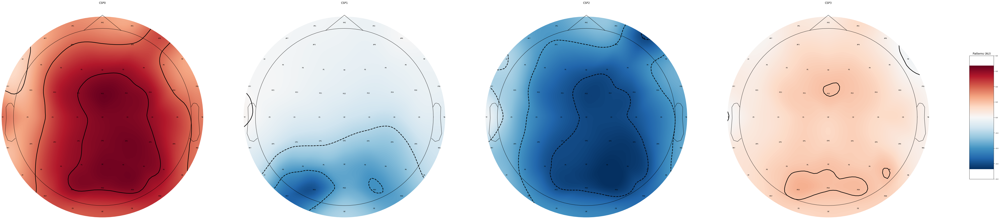

In [86]:
# Plot the regions of the scalp from which our common spatial patterns extracted it's most useful information.

analysis_csp_X = X.copy()
analysis_csp_y = y.copy()
csp.fit_transform(analysis_csp_X, analysis_csp_y)
csp.plot_patterns(EC_Start_Epochs.info, units='Patterns (AU)', size=10, show_names=True)
print("")

In [91]:
# FOR RIEMANNIAN CLASSIFICATION + SUPPORT VECTOR MACHINE 

# This is a different version of what we have just done above. 
# This time we are using Riemannian classification by matrices manipulation
# and using the tanget space.
clf = SVC(kernel='linear') # Linear Kernel
covest = Covariances()
ts = TangentSpace()

# Cross validation split. 
cv = StratifiedKFold(n_splits=10, shuffle=True)

# Make a pipeline from the given estimators
# This pipeline will sequentially apply a list of transformations and a final 
# estimator.
classifier_pipeline_Riemannian = make_pipeline(covest, ts, clf)
scores_RIE = cross_val_score(classifier_pipeline_Riemannian, X, y, cv=cv)
print(scores_RIE)

print("  RIE + SVM Classification accuracy: %f" % (np.mean(scores_RIE)))

[1.         1.         1.         1.         1.         1.
 1.         0.85714286 1.         1.        ]
  RIE + SVM Classification accuracy: 0.985714


In [88]:
# FOR SPoC + Support Vector MACHINE 
clf = SVC(kernel='linear') # Linear Kernel
spoc = SPoC()
classifier_pipeline_spoc = make_pipeline(spoc, clf)
cv = KFold(n_splits=2, shuffle=True)
y_preds_spoc = cross_val_predict(classifier_pipeline_spoc, X, y, cv=cv)

# Calculate the accuracy based on the predictions made
counter = 0
for i in range(len(y)):
    if y[i] == y_preds_spoc[i]:
        counter+=1 
print(counter / len(y))

Computing rank from data with rank=None
    Using tolerance 2.8e-09 (2.2e-16 eps * 60 dim * 2.1e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 2.8e-09 (2.2e-16 eps * 60 dim * 2.1e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.5e-09 (2.2e-16 eps * 60 dim * 2.6e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3e-09 (2.2e-16 eps * 60 dim * 2.3e+05  max singular value)
  

    Using tolerance 2.4e-09 (2.2e-16 eps * 60 dim * 1.8e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 2.4e-09 (2.2e-16 eps * 60 dim * 1.8e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3e-09 (2.2e-16 eps * 60 dim * 2.3e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.2e-09 (2.2e-16 eps * 60 dim * 2.4e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank

    Using tolerance 3.3e-09 (2.2e-16 eps * 60 dim * 2.4e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 4.1e-09 (2.2e-16 eps * 60 dim * 3.1e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 4.3e-09 (2.2e-16 eps * 60 dim * 3.2e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.5e-09 (2.2e-16 eps * 60 dim * 2.6e+05  max singular value)
    Estimated rank (mag): 60
    MAG: ra

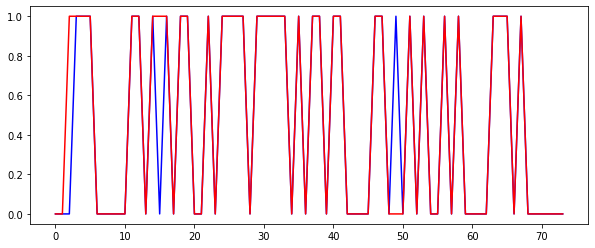

In [89]:
# Plot of predications against actual labels. Give us a visual view of how well SPoC did.
fig, ax = plt.subplots(1, 1, figsize=[10, 4])
ax.plot(y_preds_spoc, color='b')
ax.plot(y, color='r')

Computing rank from data with rank=None
    Using tolerance 2.8e-09 (2.2e-16 eps * 60 dim * 2.1e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.2e-09 (2.2e-16 eps * 60 dim * 2.4e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 2.8e-09 (2.2e-16 eps * 60 dim * 2.1e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.5e-09 (2.2e-16 eps * 60 dim * 2.6e+05  max singular value)


Computing rank from data with rank=None
    Using tolerance 2.7e-09 (2.2e-16 eps * 60 dim * 2e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.6e-09 (2.2e-16 eps * 60 dim * 2.7e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 2.6e-09 (2.2e-16 eps * 60 dim * 2e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.7e-09 (2.2e-16 eps * 60 dim * 2.8e+05  max singular value)
    

    Using tolerance 2.7e-09 (2.2e-16 eps * 60 dim * 2e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.7e-09 (2.2e-16 eps * 60 dim * 2.8e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.1e-09 (2.2e-16 eps * 60 dim * 2.3e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank 60 computed from 60 data channels with 0 projectors
Reducing data rank from 60 -> 60
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 2.4e-09 (2.2e-16 eps * 60 dim * 1.8e+05  max singular value)
    Estimated rank (mag): 60
    MAG: rank

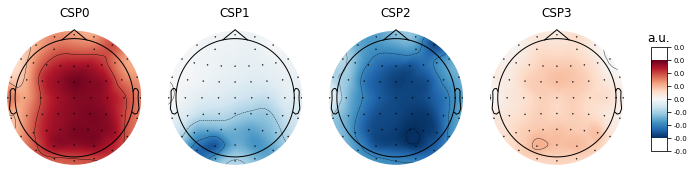

In [90]:
# Plot the regions of the scalp from which our SPoC algorithm extracted it's most useful information.

analysis_spoc_X = X.copy()
analysis_spoc_y = y.copy()
spoc.fit(analysis_spoc_X, analysis_spoc_y)
spoc.plot_patterns(EO_Start_Epochs.info,size=1.5)
print("")